<a href="https://colab.research.google.com/github/nepslor/teaching/blob/main/TimeSeriesForecasting/solutions/decision_under_uncertainty_multistage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Model predictive control for peak shaving
In this exercise we'll see how to apply one flavor of **multistage stochastic control** exploiting probabilistic forecasting. More specifically, we will use model predictive control to continuously optimize the charging and discharging operations of an electric battery. 

In our toy example we'll use [open data of the total electric consumption of the city of Zurich](https://opendata.swiss/en/dataset/viertelstundenwerte-zur-stromabgabe-in-den-netzebenen-5-und-7-in-der-stadt-zurich-seit-2010/resource/371ea4c4-7b78-47ee-a821-f7e1512b2b5f) as power profile on which performing peak shaving.   

In [9]:
import json
import cvxpy as cvx
import numpy as np
import pandas as pd
from os.path import join
import matplotlib.pyplot as plt
import networkx as nx
from copy import deepcopy
from tqdm import tqdm
np.random.seed(100)

We start by defining some parameters of the electric battery we are going to optimize. Here $x_{max}$ and $x_{min}$ represent the maximum and minimum energy that can be stored in the battery. Units are meant in MWh. $p_{max}$, $\eta$ and $\tau_{self discharge}$ are the maximum charging/discharging power in MW, the (symmetric) efficiency and the self-discharge time constant of the battery.  



In [10]:
# battery pars
pars = {'x_max':24, 
        'x_min':1,
        'p_max':24,
        'eta':0.98,
        'tau_self_discharge': 1/365/24/3600}

# add dynamic matrices
pars.update({'A': 1-pars['tau_self_discharge'],
             'B':np.array([pars['eta'], -1/pars['eta']]).reshape(1, -1)})

[print('{}: {}'.format(k, v)) for k,v in pars.items()];

x_max: 24
x_min: 1
p_max: 24
eta: 0.98
tau_self_discharge: 3.1709791983764586e-08
A: 0.999999968290208
B: [[ 0.98       -1.02040816]]


## Stochastic MPC for peak shaving
To model the optimization problem we'll use `cvxpy`, a high-level optimization language for [disciplined convex programs](https://www.cvxpy.org/tutorial/dcp/index.html) for python. We would like to perform peak shaving, penalizing more high peaks. The mathematical formulation of the problem can be written as:
$$
\begin{align}
\min_{p^{ch}, p^{di}}& \ \operatorname{CVaR}_{1-\alpha}\left[\sum_{t=1}^T (\hat{p}_{t, s} + p_{t, s}^{ch}-p_{t, s}^{di})^2\right]\\
s.t.: & x_{t+1, s} = A x_{t, s} + B [p_{t, s}^{ch}, p_{t, s}^{di}]^T \quad \forall t, s\\
     & p^{ch}, p^{di} \in \mathcal{P}, \ x \in \mathcal{X} 
\end{align}
$$   

where $x$ is the energy of the battery, $\mathcal{P}$ and $\mathcal{X}$ are (rectangular) set of constraints on the power and the state of the battery, respectively. Here $\hat{p}_{t, s}$ stands for the forecasted power of the municipality of Zurich at the $t_{th}$ step ahead in the $s_{th}$ forecasted scenario. This implies that both the inputs ($\hat{p}$) and the output ($p_{t, s}^{ch}, p_{t, s}^{di}$) of the optimization can be seen as matrices with a temporal and a scenario dimension. 

As we recall from the lesson, the CVaR is the integral value over the 
The $\text{CVaR}_(1-\alpha)$ operator is defined as the integral of the loss function above the $\alpha$ quantile:
$$\operatorname{CVaR}_{1-\alpha}(w)=\frac{1}{\alpha} \int_{F_W(z) \geqslant 1-\alpha} zdz$$
Since we are using scenarios to approximate the probability distribution of the forecasted quantity, this can be obtained as the sum of the greatest $1-\alpha$ fraction of the loss function across across the scenarios. 

### ❓ Complete the control problem
In the following cell there's the cvxpy code for the above control problem. What's missing are the power and state constraints and the objective function. For writing the CVaR operator, try to use the `cvx.sum_largest` function 

In [11]:
t = 24 # timesteps
n_scenarios = 10 # number of scenarios

def cast_problem(t, n_scenarios):
  p_ch = cvx.Variable((t, n_scenarios))
  p_di = cvx.Variable((t, n_scenarios))

  x = cvx.Variable((t, n_scenarios))

  # parameters
  x_start = cvx.Parameter((1,))
  p_hat = cvx.Parameter((t, n_scenarios))

  # state constraints
  c = []
  c.append(x <= pars['x_max'])
  c.append(x >= pars['x_min'])

  # control constraints
  c.append(p_ch >= 0)
  c.append(p_ch <= pars['p_max'])
  c.append(p_di >= 0)
  c.append(p_di <= pars['p_max'])

  # dynamic equations
  for s in range(n_scenarios):
    x_scen = cvx.hstack([x_start, x[:, s]])
    u = cvx.hstack([p_ch[:, [s]], p_di[:, [s]]])
    c.append(x_scen[1:] == x_scen[:-1] * pars['A']  + cvx.reshape(u @ pars['B'].T, t))

  obj = cvx.sum_largest(cvx.sum((p_ch - p_di + p_hat)**2, axis=0), int(n_scenarios*0.9))
  problem = cvx.Problem(cvx.Minimize(obj), constraints=c)
  return problem, x_start, p_hat, p_ch, p_di, x, c, obj

Let's solve one instance of the problem using the following signal as an example for which is easy to see if we get the indended behavior:
$$\hat{p} = sin(3 t \pi / T) + 0.05\mathcal{w}_t$$
where $t$ is the timestep and $\mathcal{w}_t$ is a random walk process. Since our objective function penalizes more high deviations from the zero signal, we expect to see plateaus in the optimized profile. 

In [12]:
problem, x_start, p_hat, p_ch, p_di, x, c, obj = cast_problem(t, n_scenarios)
power_profile = np.outer(np.sin(np.arange(t)*3*np.pi/t).reshape(-1, 1), np.ones(n_scenarios)) + 0.05*np.cumsum(np.random.randn(t, n_scenarios), axis=0)
x_start.value = [5]
p_hat.value = power_profile
problem.solve(solver = 'ECOS_BB')

4.786071907037044

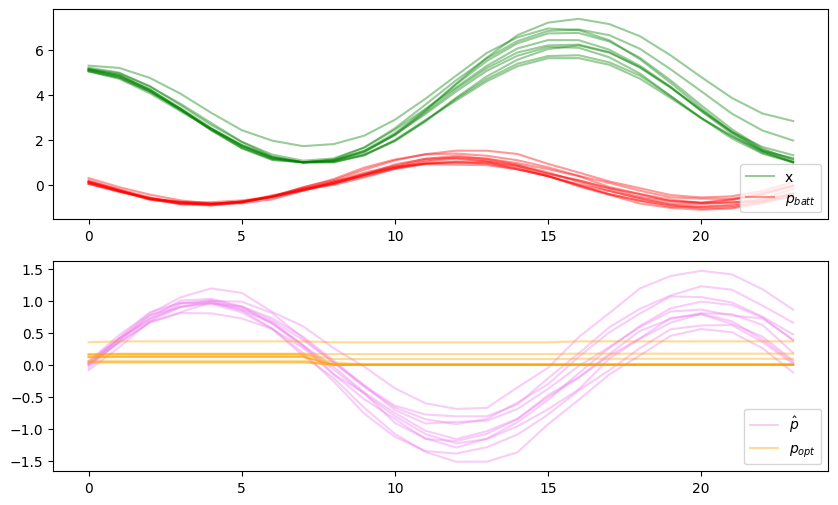

In [13]:
def plot_results(x, p_batt, p_hat, ax=None):
  if ax is None:
    fig, ax = plt.subplots(2, 1, figsize=(10, 6))
  l1 = ax[0].plot(x, color='green', alpha=0.4)
  l2 = ax[0].plot(p_batt, color='r', alpha=0.4)
  l3 = ax[1].plot(p_hat, color='violet', alpha=0.4)
  l4 = ax[1].plot(p_hat + p_batt, color='orange', alpha=0.4)
  ax[0].legend([l1[0], l2[0]], ['x', r'$p_{batt}$'],loc='lower right')
  ax[1].legend([l3[0], l4[0]], [r'$\hat{p}$',r'$p_{opt}$'],loc='lower right')
  return l1, l2, l3, l4

plot_results(x.value, p_ch.value-p_di.value, p_hat.value);

### Non-anticipativity constraint
The above solution seems to be correct. But what action will we apply at the next iteration? We have solved the problem using 10 scenarios, and for each of them we have retrieved a different power profile for the battery. However, we can only apply a solution at the next step - we have only one battery, not 10 hypothetical ones!

To solve this problem we add a non-anticipativity constraint to the problem: we require all the first step actions to be the same:
$$p^{ch}_{0, s} = p^{ch}_{0, z}, \quad p^{di}_{0, s} = p^{di}_{0, z}  \quad \forall s, z$$ 

This is called non-antiipative since this prevent us to use information ahead of time: at the first step we are not aware of which temporal trace (scenario) will become true; our best guess is to take an action accomodating all the possible scenarios. 


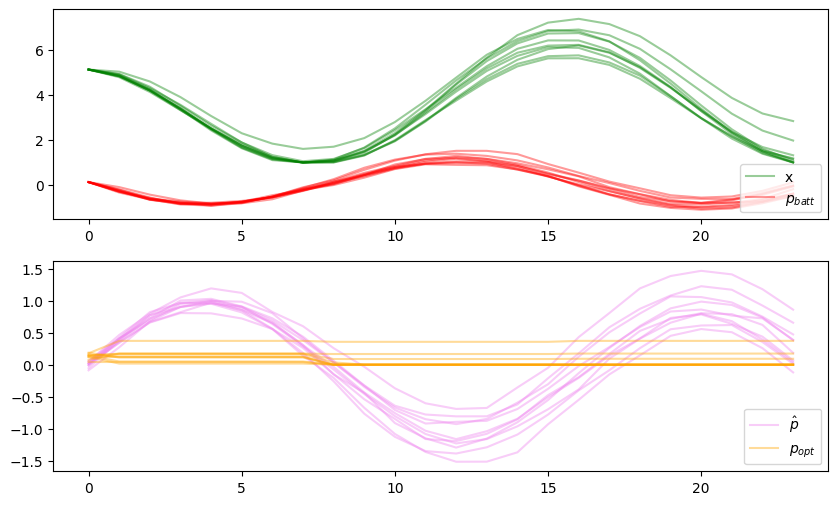

In [14]:
def cast_problem_nonanticipativity(t, n_scenarios):
  problem, x_start, p_hat, p_ch, p_di, x, c, obj = cast_problem(t, n_scenarios)
  for s in range(n_scenarios):
    # non-anticipativity constraint
    c.append(p_ch[0, s] ==  p_ch[0, np.minimum(s+1, n_scenarios-1)])
    c.append(p_di[0, s] ==  p_di[0, np.minimum(s+1, n_scenarios-1)])
  problem = cvx.Problem(cvx.Minimize(obj), constraints=c)
  return problem, x_start, p_hat, p_ch, p_di, x
  
problem, x_start, p_hat, p_ch, p_di, x = cast_problem_nonanticipativity(t, n_scenarios)
x_start.value = [5]
p_hat.value = power_profile
problem.solve(solver='ECOS_BB')
plot_results(x.value, p_ch.value-p_di.value, p_hat.value);

## Peak shaving of the city of Zurich power profile
We'll take data from the municipality of Zurich to perform peak shaving. We will resample the data to 1 hour, for computational reasons.

In [15]:
data = pd.read_csv('https://data.stadt-zuerich.ch/dataset/ewz_stromabgabe_netzebenen_stadt_zuerich/download/ewz_stromabgabe_netzebenen_stadt_zuerich.csv', index_col=0,nrows=96*365, parse_dates=[0])
print(data.head())
data.index = pd.DatetimeIndex(pd.to_datetime(data.index, utc=True))

                           Value_NE5  Value_NE7
Timestamp                                      
2010-01-01 00:15:00+01:00  18474.235  50770.765
2010-01-01 00:30:00+01:00  18168.595  49610.905
2010-01-01 00:45:00+01:00  18333.750  48503.250
2010-01-01 01:00:00+01:00  18197.865  48263.635
2010-01-01 01:15:00+01:00  18231.925  47738.575


<Axes: xlabel='Timestamp'>

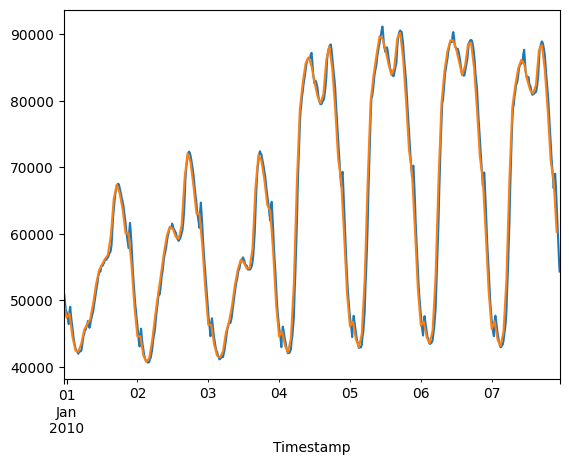

In [16]:
data['Value_NE7'].iloc[:96*7].plot()
data.index = pd.to_datetime(data.index)
data = data.resample('1h').mean()
data['Value_NE7'].iloc[:24*7].plot()

### Forecasting and bootstrapped scenarios
In the following code, we use a simple regressor-based forecaster. The forecaster has also a method, called predict_scenarios-

### ❓Can you tell what (and how) the predic_scenarios method does?

In [26]:
from lightgbm import LGBMRegressor
class LGBM:
  """
  A simple regressor-based forecaster
  """
  def __init__(self, pars):
    self.pars = pars
    self.target_cols = None
    self.models = []
    self.error_scenarios = None

  def fit(self, x, y):
    self.target_cols = y.columns
    for c in y.columns:
        m = LGBMRegressor(**self.pars).fit(x.values, y[c].values.ravel())
        self.models.append(m)
    self.error_scenarios = pd.DataFrame(y.values - self.predict(x), index=x.index)
    return self

  def predict(self, x):
    y_hat = []
    for m, c in zip(self.models, self.target_cols):
        y_hat.append(pd.Series(m.predict(x.values), index=x.index, name=c))
    return pd.concat(y_hat, axis=1)
  
  def predict_scenarios(self, x, n_scenarios):
    y_hat = self.predict(x)
    err_scens = []
    for i in range(len(x)):
      h_filt = self.error_scenarios.index.hour ==x.iloc[[i]].index.hour[0]
      chosen = np.random.choice(self.error_scenarios.index[h_filt], n_scenarios)
      err_scens.append(self.error_scenarios.loc[chosen, :].T)
    return  np.expand_dims(y_hat.values, 2) + np.rollaxis(np.dstack(err_scens), -1)

def get_hankel(df, embedding=24*4*2):
    dfs = {}
    for col in df.columns:
        df_i = pd.concat([df[col].shift(-i) for i in range(embedding)], axis=1).iloc[:-embedding]
        df_i.columns = [i for i in range(df_i.shape[1])]
        dfs[col] = df_i
    return pd.concat(dfs, axis=1)

lagged_mav = lambda x, k: x.copy().rolling('{}d'.format(k)).mean()


In [ ]:
target = 'Value_NE7'
n_days = 2

# detrended profile, rescaled to MWh and embed it using a 2-days embedding
df_emb = get_hankel(data[[target]]-lagged_mav(data[[target]], 24*7), embedding=n_days*24) / 1e3
x = df_emb.loc[:, df_emb.columns.get_level_values(1) < 24]
y = df_emb.loc[:, df_emb.columns.get_level_values(1) >= 24]
x['hour'] = x.index.hour
x['weekday'] = x.index.weekday

# divide in training and tes sets
df = pd.concat({'x':x, 'y':y}, axis=1)
n_tr = int(len(df)*0.7)
x_tr, x_te = df['x'].iloc[:n_tr, :], df['x'].iloc[n_tr:, :]
y_tr, y_te = df['y'].iloc[:n_tr, :], df['y'].iloc[n_tr:, :]

In [18]:
lgb_pars = {'n_estimators': 100, 'learning_rate': 0.1, 'num_leaves': 31, 'max_depth': 5}
lgbm = LGBM(lgb_pars).fit(x_tr, y_tr)

In [19]:
from matplotlib import animation
from IPython.display import HTML
def scen_animation(y_te, y_hat, qs, n_rows=50):
    fig, ax = plt.subplots(1);
    t = np.arange(y_hat.shape[1])
    line1, = ax.plot(y_hat[0, :], lw=2);
    line2, = ax.plot(y_te[0, :], lw=2);
    line3 = ax.plot(np.squeeze(qs[0, :, :]), 'r', lw=2, alpha=0.1);
    #ax.set_ylim(-13, 13)
    def animate(i):
        line1.set_data(t, y_te[i, :]);
        line2.set_data(t, y_hat[i, :]);
        [line3[j].set_data(t, qsi) for j, qsi in enumerate(qs[i, :, :].T)];
        return (line1, line2, *line3, )

    def init():
        line1.set_data([], []);
        return (line1,)

    ani = animation.FuncAnimation(fig, animate, init_func=init, frames=n_rows, interval=100, blit=True)
    plt.close('all')
    return HTML(ani.to_jshtml())

In [20]:
close_loop_steps = 24*2
n_scenarios = 20
scens = lgbm.predict_scenarios(x_te.iloc[:close_loop_steps, :], n_scenarios)
scen_animation(y_te.iloc[:close_loop_steps, :].values, lgbm.predict(x_te.iloc[:close_loop_steps, :]).values, scens, n_rows=close_loop_steps)

### Closed loop simulation
In the following cell, the `solve_close_loop` function solves different instances of the MPC base problem.  
❓ Can you tell what the following code does? Take a few minutes to analyze it

In [21]:
def solve_close_loop(n_scenarios = 5):
  scens = lgbm.predict_scenarios(x_te.iloc[:close_loop_steps, :], n_scenarios)
  problem, x_start, p_hat, p_ch, p_di, x = cast_problem_nonanticipativity(t, n_scenarios=n_scenarios)

  x_last = 5
  # optimal actions that have been applied by the MPC after the optimization (one per step)
  p_batt_opt_history, x_opt_history = [], []
  # solutions for the whole horizon (n_scenrios * (control horizon) per step)
  p_batt_sol_history, x_sol_history = [], []
  for i in tqdm(range(close_loop_steps)):
    x_start.value = np.atleast_1d(x_last)
    p_hat.value = scens[i, :, :] 
    problem.solve(solver='ECOS_BB', warm_start=True)
    x_last = x.value[0, 0]
    p_batt_opt_history.append(p_ch.value[0, 0] -p_di.value[0, 0])
    x_opt_history.append(x_last)
    p_batt_sol_history.append(p_ch.value-p_di.value)
    x_sol_history.append(x.value)

  # reshaping dimensions
  p_batt_sol_history = np.rollaxis(np.dstack(p_batt_sol_history), -1)
  x_sol_history = np.rollaxis(np.dstack(x_sol_history), -1)
  p_batt_opt_history = np.hstack(p_batt_opt_history)
  x_opt_history = np.hstack(x_opt_history)

  # formatting output
  opt_history = {'p_batt': p_batt_opt_history, 'x':x_opt_history}
  sol_history = {'p_batt': p_batt_sol_history, 'x':x_sol_history}
  return opt_history, sol_history, scens

opt_history, sol_history, scens = solve_close_loop(n_scenarios)

100%|██████████| 48/48 [00:03<00:00, 13.66it/s]


In [22]:
def battery_animation(p_batt, x_batt, p_hat, n_rows=50):
    fig, ax = plt.subplots(2, 1);
    t = np.arange(p_batt.shape[1])
    p_opt = p_hat + p_batt
    line1, line2, line3, line4 = plot_results(x_batt[0, :, :], p_batt[0, :, :], p_hat[0, :, :], ax=ax)
    def animate(i):
        [line1[j].set_data(t, qsi) for j, qsi in enumerate(p_batt[i, :, :].T)];
        [line2[j].set_data(t, qsi) for j, qsi in enumerate(x_batt[i, :, :].T)]
        [line3[j].set_data(t, qsi) for j, qsi in enumerate(p_hat[i, :, :].T)];
        [line4[j].set_data(t, qsi) for j, qsi in enumerate(p_opt[i, :, :].T)];
        return (*line1, *line2, *line3, *line4, )

    def init():
        [line1[j].set_data([], []) for j, qsi in enumerate(line1)];
        return (*line1,)

    ani = animation.FuncAnimation(fig, animate, init_func=init, frames=n_rows, interval=100, blit=True)
    plt.close('all')
    return HTML(ani.to_jshtml())

battery_animation(sol_history['p_batt'], sol_history['x'], scens[:close_loop_steps, :],  n_rows=close_loop_steps)

 91%|█████████ | 1304/1440 [00:12<00:00, 138.98it/s]/usr/local/lib/python3.10/dist-packages/cvxpy/problems/problem.py:1385: UserWarning: Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.
  warnings.warn(
100%|██████████| 1440/1440 [00:13<00:00, 106.56it/s]


Text(0.5, 1.0, 'n_scens = 2, closed loop obj: 2.540e+01:')

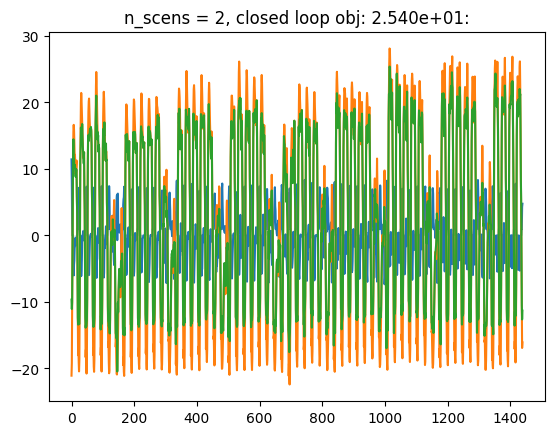

In [23]:
close_loop_steps = 24*60
n_scenarios = 2
opt_history_1, sol_history, scens = solve_close_loop(n_scenarios)

p_opt = y_te.iloc[:close_loop_steps, 0].values +  opt_history_1['p_batt']
plt.plot(opt_history_1['p_batt'])
plt.plot(y_te.iloc[:close_loop_steps, 0].values)
plt.plot(p_opt)
plt.title('n_scens = {}, closed loop obj: {:0.3e}:'.format(n_scenarios, np.max(p_opt)))


100%|██████████| 1440/1440 [00:47<00:00, 30.26it/s]


Text(0.5, 1.0, 'n_scens = 10, closed loop obj: 2.444e+01:')

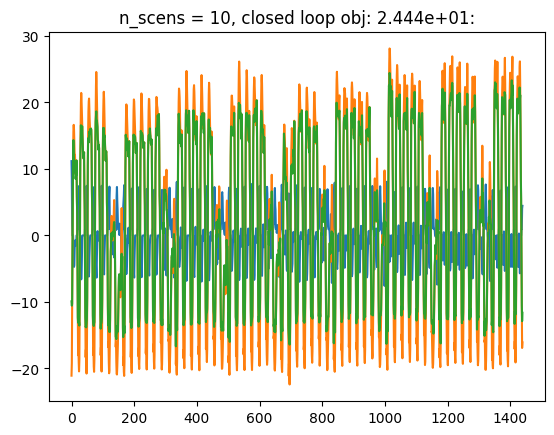

In [24]:
n_scenarios = 10
opt_history_10, sol_history, scens = solve_close_loop(n_scenarios)

p_opt = y_te.iloc[:close_loop_steps, 0].values +  opt_history_10['p_batt']
plt.plot(opt_history_10['p_batt'])
plt.plot(y_te.iloc[:close_loop_steps, 0].values)
plt.plot(p_opt)
plt.title('n_scens = {}, closed loop obj: {:0.3e}:'.format(n_scenarios, np.max(p_opt)))


100%|██████████| 1440/1440 [04:39<00:00,  5.15it/s]


Text(0.5, 1.0, 'n_scens = 50, closed loop obj: 2.436e+01:')

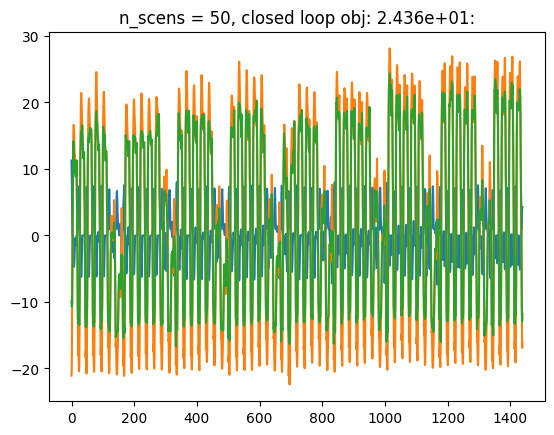

In [25]:
n_scenarios = 50
opt_history_50, sol_history, scens = solve_close_loop(n_scenarios)

p_opt = y_te.iloc[:close_loop_steps, 0].values +  opt_history_50['p_batt']
plt.plot(opt_history_50['p_batt'])
plt.plot(y_te.iloc[:close_loop_steps, 0].values)
plt.plot(p_opt)
plt.title('n_scens = {}, closed loop obj: {:0.3e}:'.format(n_scenarios, np.max(p_opt)))
